# Table of Contents
1. [Import packages and I/O Data](#import)
2. [Data Analysis](#data)<br>
    2.1. Statistics of Data<br>
    2.2. Missing Rate and Imputations<br>
    2.3. Distirbution Analysis and Visualizations<br>
    2.4. Data manipulations (Imputation and Encoding<br>
3. [Modeling](#model)<br>
    3.1. Split Data into Training and Validation.<br>
    3.2. Predict

## 1 Import packages and I/O
<a id="import"></a>

### 1.1 Import packages

In [1]:
import Pkg; 
Pkg.add("CSV")
Pkg.add("MLDataUtils")
Pkg.add("DecisionTree")
Pkg.add("MLBase")
Pkg.add("StatsBase")
Pkg.add("StatPlots")
Pkg.add("ScikitLearn")
#Pkg.add("RandomForests")
import Statistics: median

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Upda

### 1.2 Read Data

In [2]:
using DataFrames
using CSV

df1 = CSV.read(
        download("https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data"),
        header = vcat(["ID", "BM"], collect(1:30)),
        type = Dict(1 => Int64, 2=> String));


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  121k  100  121k    0     0   5197      0  0:00:23  0:00:23 --:--:-- 26996-     0


In [3]:
df1 = CSV.read(
        download("https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data"),
        header = vcat(["ID", "BM"], collect(1:30)));

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  121k  100  121k    0     0  17931      0  0:00:06  0:00:06 --:--:-- 26461


## 2. Data Analysis
<a id="data"></a>

### 2.1 Statistics of Data

In [5]:
describe(df1)

,variable,mean,min,median,max,nunique,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Union…,Int64,DataType
1,ID,3.03718e7,8670,906024.0,911320502,,0,Int64
2,BM,,B,,M,2,0,String
3,1,14.1273,6.981,13.37,28.11,,0,Float64
4,2,19.2896,9.71,18.84,39.28,,0,Float64
5,3,91.969,43.79,86.24,188.5,,0,Float64
6,4,654.889,143.5,551.1,2501.0,,0,Float64
7,5,0.0963603,0.05263,0.09587,0.1634,,0,Float64
8,6,0.104341,0.01938,0.09263,0.3454,,0,Float64
9,7,0.0887993,0.0,0.06154,0.4268,,0,Float64


#### Data Size

In [6]:
size(df1)

(569, 32)

#### Head and Tail

In [15]:
df1[5:10,:]

,ID,BM,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,84358402,M,20.29,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678
2,843786,M,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.00751,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244
3,844359,M,18.25,19.98,119.6,1040.0,0.09463,0.109,0.1127,0.074,0.1794,0.05742,0.4467,0.7732,3.18,53.91,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,22.88,27.66,153.2,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
4,84458202,M,13.71,20.83,90.2,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,0.07451,0.5835,1.377,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.6,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151
5,844981,M,13.0,21.82,87.5,519.8,0.1273,0.1932,0.1859,0.09353,0.235,0.07389,0.3063,1.002,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.2,739.3,0.1703,0.5401,0.539,0.206,0.4378,0.1072
6,84501001,M,12.46,24.04,83.97,475.9,0.1186,0.2396,0.2273,0.08543,0.203,0.08243,0.2976,1.599,2.039,23.94,0.007149,0.07217,0.07743,0.01432,0.01789,0.01008,15.09,40.68,97.65,711.4,0.1853,1.058,1.105,0.221,0.4366,0.2075


In [11]:
tail(df1)

,ID,BM,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,926125,M,20.92,25.09,143.0,1347.0,0.1099,0.2236,0.3174,0.1474,0.2149,0.06879,0.9622,1.026,8.758,118.8,0.006399,0.0431,0.07845,0.02624,0.02057,0.006213,24.29,29.41,179.1,1819.0,0.1407,0.4186,0.6599,0.2542,0.2929,0.09873
2,926424,M,21.56,22.39,142.0,1479.0,0.111,0.1159,0.2439,0.1389,0.1726,0.05623,1.176,1.256,7.673,158.7,0.0103,0.02891,0.05198,0.02454,0.01114,0.004239,25.45,26.4,166.1,2027.0,0.141,0.2113,0.4107,0.2216,0.206,0.07115
3,926682,M,20.13,28.25,131.2,1261.0,0.0978,0.1034,0.144,0.09791,0.1752,0.05533,0.7655,2.463,5.203,99.04,0.005769,0.02423,0.0395,0.01678,0.01898,0.002498,23.69,38.25,155.0,1731.0,0.1166,0.1922,0.3215,0.1628,0.2572,0.06637
4,926954,M,16.6,28.08,108.3,858.1,0.08455,0.1023,0.09251,0.05302,0.159,0.05648,0.4564,1.075,3.425,48.55,0.005903,0.03731,0.0473,0.01557,0.01318,0.003892,18.98,34.12,126.7,1124.0,0.1139,0.3094,0.3403,0.1418,0.2218,0.0782
5,927241,M,20.6,29.33,140.1,1265.0,0.1178,0.277,0.3514,0.152,0.2397,0.07016,0.726,1.595,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.74,39.42,184.6,1821.0,0.165,0.8681,0.9387,0.265,0.4087,0.124
6,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.0,0.0,0.1587,0.05884,0.3857,1.428,2.548,19.15,0.007189,0.00466,0.0,0.0,0.02676,0.002783,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0,0.0,0.2871,0.07039


#### Percentiles

In [20]:
#Pkg.add("StatsBase")
#using StatsBase
percentile(df1[:4], 0.9)

MethodError: MethodError: no method matching percentile(::Array{Union{Missing, Float64},1}, ::Float64)
Closest candidates are:
  percentile(!Matched::AbstractArray{#s39,N} where N where #s39<:Real, ::Any) at /home/jrun/.julia/packages/StatsBase/NzjNi/src/scalarstats.jl:189

### 2.2 Missing Rate and Imputation

In [26]:
#manually add missing values
df1[1,3] = missing

MethodError: MethodError: Cannot `convert` an object of type String to an object of type Float64
Closest candidates are:
  convert(::Type{T<:Number}, !Matched::T<:Number) where T<:Number at number.jl:6
  convert(::Type{T<:Number}, !Matched::Number) where T<:Number at number.jl:7
  convert(::Type{T<:Number}, !Matched::Base.TwicePrecision) where T<:Number at twiceprecision.jl:250
  ...

In [22]:
df1

,ID,BM,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,M,missing,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,M,19.69,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
4,84348301,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,0.00911,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173
5,84358402,M,20.29,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678
6,843786,M,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.00751,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244
7,844359,M,18.25,19.98,119.6,1040.0,0.09463,0.109,0.1127,0.074,0.1794,0.05742,0.4467,0.7732,3.18,53.91,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,22.88,27.66,153.2,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
8,84458202,M,13.71,20.83,90.2,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,0.07451,0.5835,1.377,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.6,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151
9,844981,M,13.0,21.82,87.5,519.8,0.1273,0.1932,0.1859,0.09353,0.235,0.07389,0.3063,1.002,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.2,739.3,0.1703,0.5401,0.539,0.206,0.4378,0.1072


#### Check missing values

In [23]:
showcols(df1)

,variable,eltype,nmissing,first,last
,Symbol,DataType,Int64,Any,Any
1,ID,Int64,0,842302,92751
2,BM,String,0,M,B
3,1,Float64,1,missing,7.76
4,2,Float64,0,10.38,24.54
5,3,Float64,0,122.8,47.92
6,4,Float64,0,1001.0,181.0
7,5,Float64,0,0.1184,0.05263
8,6,Float64,0,0.2776,0.04362
9,7,Float64,0,0.3001,0.0


#### Impute missing value with Median

UndefVarError: UndefVarError: help not defined

In [27]:
recode!(df1[:3], missing => median(skipmissing(df1[:3])));
head(df1)

,ID,BM,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,M,13.355,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,M,19.69,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
4,84348301,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,0.00911,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173
5,84358402,M,20.29,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678
6,843786,M,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.00751,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


#### rename columns

In [30]:
df1

,ID,BM,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,M,13.355,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,M,19.69,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
4,84348301,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,0.00911,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173
5,84358402,M,20.29,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678
6,843786,M,12.45,15.7,82.57,477.1,0.1278,0.17,0.1578,0.08089,0.2087,0.07613,0.3345,0.8902,2.217,27.19,0.00751,0.03345,0.03672,0.01137,0.02165,0.005082,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244
7,844359,M,18.25,19.98,119.6,1040.0,0.09463,0.109,0.1127,0.074,0.1794,0.05742,0.4467,0.7732,3.18,53.91,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,22.88,27.66,153.2,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
8,84458202,M,13.71,20.83,90.2,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,0.07451,0.5835,1.377,3.856,50.96,0.008805,0.03029,0.02488,0.01448,0.01486,0.005412,17.06,28.14,110.6,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151
9,844981,M,13.0,21.82,87.5,519.8,0.1273,0.1932,0.1859,0.09353,0.235,0.07389,0.3063,1.002,2.406,24.32,0.005731,0.03502,0.03553,0.01226,0.02143,0.003749,15.49,30.73,106.2,739.3,0.1703,0.5401,0.539,0.206,0.4378,0.1072


In [43]:
df1;

In [29]:
rename!(df1, [Symbol("$i")=>Symbol("col$i") for i in 1:30])
names(df1)

ErrorException: Tried renaming 1 to col1, when col1 already exists in the Index.

### 2.3 Distribution Analysis

In [44]:
using Plots, StatPlots 

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1186


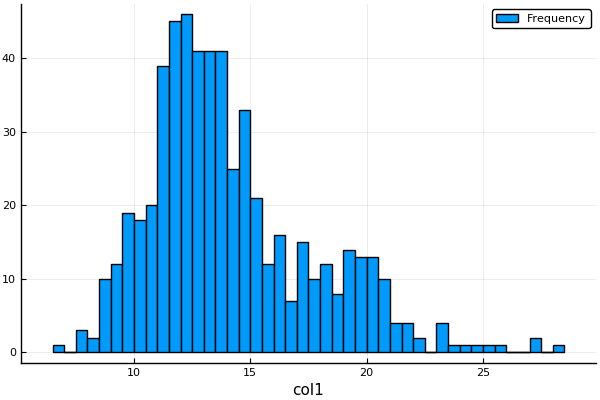

In [45]:
pyplot() #Set the backend as matplotlib.pyplot 
Plots.histogram(df1[:col1],bins=50,xlabel="col1",labels="Frequency")  

### 2.4 Data manipulation

#### slicing by row/column

In [46]:
df_tmp1 = df1[1:100,1];
df_tmp2 = df1[1:3,:]

,ID,BM,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30
,Int64⍰,String⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,M,13.355,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,M,19.69,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758


#### join using dummy case

In [47]:
using DataFrames
dfn = DataFrame(ID = [20, 40], Name = ["John Doe", "Jane Doe"])
dfj = DataFrame(ID = [20, 40], Job = ["Lawyer", "Doctor"])


,ID,Job
,Int64,String
1,20,Lawyer
2,40,Doctor


In [49]:
dfj

,ID,Job
,Int64,String
1,20,Lawyer
2,40,Doctor


In [58]:
?join

search: join joinpath adjoint typejoin



```
join([io::IO,] strings, delim, [last])
```

Join an array of `strings` into a single string, inserting the given delimiter between adjacent strings. If `last` is given, it will be used instead of `delim` between the last two strings. If `io` is given, the result is written to `io` rather than returned as as a `String`.  For example,

# Examples

```jldoctest
julia> join(["apples", "bananas", "pineapples"], ", ", " and ")
"apples, bananas and pineapples"
```

`strings` can be any iterable over elements `x` which are convertible to strings via `print(io::IOBuffer, x)`. `strings` will be printed to `io`.

---

```
join(df1, df2; on = Symbol[], kind = :inner, makeunique = false,
     indicator = nothing, validate = (false, false))
```

Join two `DataFrame` objects

### Arguments

  * `df1`, `df2` : the two AbstractDataFrames to be joined

### Keyword Arguments

  * `on` : A column, or vector of columns to join df1 and df2 on. If the column(s)   that df1 and df2 will be joined on have different names, then the columns   should be `(left, right)` tuples or `left => right` pairs, or a vector of   such tuples or pairs. `on` is a required argument for all joins except for   `kind = :cross`
  * `kind` : the type of join, options include:

      * `:inner` : only include rows with keys that match in both `df1` and `df2`, the default
      * `:outer` : include all rows from `df1` and `df2`
      * `:left` : include all rows from `df1`
      * `:right` : include all rows from `df2`
      * `:semi` : return rows of `df1` that match with the keys in `df2`
      * `:anti` : return rows of `df1` that do not match with the keys in `df2`
      * `:cross` : a full Cartesian product of the key combinations; every row of `df1` is matched with every row of `df2`

  * `makeunique` : if `false` (the default), an error will be raised if duplicate names are found in columns not joined on; if `true`, duplicate names will be suffixed with `_i` (`i` starting at 1 for the first duplicate).
  * `indicator` : Default: `nothing`. If a `Symbol`, adds categorical indicator  column named `Symbol` for whether a row appeared in only `df1` (`"left_only"`),  only `df2` (`"right_only"`) or in both (`"both"`). If `Symbol` is already in use,  the column name will be modified if `makeunique=true`.
  * `validate` : whether to check that columns passed as the `on` argument  define unique keys in each input data frame (according to [`isequal`](@ref)).  Can be a tuple or a pair, with the first element indicating whether to  run check for `df1` and the second element for `df2`.  By default no check is performed.

For the three join operations that may introduce missing values (`:outer`, `:left`, and `:right`), all columns of the returned data table will support missing values.

When merging `on` categorical columns that differ in the ordering of their levels, the ordering of the left `DataFrame` takes precedence over the ordering of the right `DataFrame`

### Result

  * `::DataFrame` : the joined DataFrame

### Examples

```julia
name = DataFrame(ID = [1, 2, 3], Name = ["John Doe", "Jane Doe", "Joe Blogs"])
job = DataFrame(ID = [1, 2, 4], Job = ["Lawyer", "Doctor", "Farmer"])

join(name, job, on = :ID)
join(name, job, on = :ID, kind = :outer)
join(name, job, on = :ID, kind = :left)
join(name, job, on = :ID, kind = :right)
join(name, job, on = :ID, kind = :semi)
join(name, job, on = :ID, kind = :anti)
join(name, job, kind = :cross)

job2 = DataFrame(identifier = [1, 2, 4], Job = ["Lawyer", "Doctor", "Farmer"])
join(name, job2, on = (:ID, :identifier))
join(name, job2, on = :ID => :identifier)
```


In [53]:
join(dfn, dfj, on = :ID, kind = :right)

,ID,Name,Job
,Int64⍰,String⍰,String
1,20,John Doe,Lawyer
2,40,Jane Doe,Doctor


#### Numerical data: MinMax Scaling

In [60]:
?fill

search: fill fill! finally findall filter filter! filesize filemode isfile



2-element Array{Any,1}:
 ```
fill(x, dims)
```

Create an array filled with the value `x`. For example, `fill(1.0, (5,5))` returns a 5×5 array of floats, with each element initialized to `1.0`.

# Examples

```jldoctest
julia> fill(1.0, (5,5))
5×5 Array{Float64,2}:
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
 1.0  1.0  1.0  1.0  1.0
```

If `x` is an object reference, all elements will refer to the same object. `fill(Foo(), dims)` will return an array filled with the result of evaluating `Foo()` once.
                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [62]:
length([1,2,3])

3

In [59]:
function minmax_scaler(x)
    min_val = minimum(x)
    max_val = maximum(x)
    len_x = length(x)
    if min_val == max_val
        return 0
    else
        return (x - fill(min_val,len_x))/(max_val-min_val)
    end
end
    

minmax_scaler (generic function with 1 method)

In [63]:
df1[:3]=minmax_scaler(df1[:3]);
head(df1,5)

,ID,BM,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30
,Int64⍰,String⍰,Float64,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,M,0.301671,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,M,0.643144,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,M,0.601496,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
4,84348301,M,0.21009,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,0.00911,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173
5,84358402,M,0.629893,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678


#### Categorical data: Label Encoding 

In [65]:
?@sk_import

@sk*import imports models from the Python version of scikit-learn. For instance, the Julia equivalent of `from sklearn.linear*model import LinearRegression, LogicisticRegression` is:

```
@sk_import linear_model: (LinearRegression, LogisticRegression)
model = fit!(LinearRegression(), X, y)
```


In [64]:
using ScikitLearn
@sk_import preprocessing: LabelEncoder
labelencoder = LabelEncoder()


PyObject LabelEncoder()

In [66]:
category = [2]
for col in category
    df1[col] = fit_transform!(labelencoder, df1[col])
end

In [67]:
head(df1,5)

,ID,BM,col1,col2,col3,col4,col5,col6,col7,col8,col9,col10,col11,col12,col13,col14,col15,col16,col17,col18,col19,col20,col21,col22,col23,col24,col25,col26,col27,col28,col29,col30
,Int64⍰,Int64,Float64,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰,Float64⍰
1,842302,1,0.301671,10.38,122.8,1001.0,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189
2,842517,1,0.643144,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.186,0.275,0.08902
3,84300903,1,0.601496,21.25,130.0,1203.0,0.1096,0.1599,0.1974,0.1279,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.00615,0.04006,0.03832,0.02058,0.0225,0.004571,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.243,0.3613,0.08758
4,84348301,1,0.21009,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.1052,0.2597,0.09744,0.4956,1.156,3.445,27.23,0.00911,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.5,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.173
5,84358402,1,0.629893,14.34,135.1,1297.0,0.1003,0.1328,0.198,0.1043,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.01149,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.2,1575.0,0.1374,0.205,0.4,0.1625,0.2364,0.07678


In [69]:
?convert

search: convert ConvergenceException code_native @code_native



```
convert(T, x)
```

Convert `x` to a value of type `T`.

If `T` is an [`Integer`](@ref) type, an [`InexactError`](@ref) will be raised if `x` is not representable by `T`, for example if `x` is not integer-valued, or is outside the range supported by `T`.

# Examples

```jldoctest
julia> convert(Int, 3.0)
3

julia> convert(Int, 3.5)
ERROR: InexactError: Int64(Int64, 3.5)
Stacktrace:
[...]
```

If `T` is a [`AbstractFloat`](@ref) or [`Rational`](@ref) type, then it will return the closest value to `x` representable by `T`.

```jldoctest
julia> x = 1/3
0.3333333333333333

julia> convert(Float32, x)
0.33333334f0

julia> convert(Rational{Int32}, x)
1//3

julia> convert(Rational{Int64}, x)
6004799503160661//18014398509481984
```

If `T` is a collection type and `x` a collection, the result of `convert(T, x)` may alias all or part of `x`.

```jldoctest
julia> x = Int[1, 2, 3];

julia> y = convert(Vector{Int}, x);

julia> y === x
true
```

---

`convert(StringArray{U}, A::StringArray{T})`

convert `A` to StringArray of another element type (`U`) without copying the underlying data.

---

```
convert(T, X::DataValueArray)
```

Convert `X` to an `AbstractArray` of type `T`. Note that if `X` contains any null entries then calling `convert` without supplying a replacement value for null entries will result in an error.

Currently supported return type arguments include: `Array`, `Array{T}`, `Vector`, `Matrix`.

```
convert(T, X::DataValueArray, replacement)
```

Convert `X` to an `AbstractArray` of type `T` and replace all null entries of `X` with `replacement` in the result.


In [71]:
typeof(x)
typeof(df1)

DataFrame

In [68]:
x = convert(Array, df1[:,3:32])
y = convert(Array, df1[:,2]);

## 3. Modeling
<a id="model"></a>

### 3.1 Split data into traning and test

In [74]:
?shuffleobs

search: shuffleobs



```
shuffleobs(data, [obsdim])
```

Return a "subset" of `data` that spans all observations, but has the order of the observations shuffled.

The values of `data` itself are not copied. Instead only the indices are shuffled. This function calls [`datasubset`](@ref) to accomplish that, which means that the return value is likely of a different type than `data`.

```julia
# For Arrays the subset will be of type SubArray
@assert typeof(shuffleobs(rand(4,10))) <: SubArray

# Iterate through all observations in random order
for (x) in eachobs(shuffleobs(X))
    ...
end
```

The optional (keyword) parameter `obsdim` allows one to specify which dimension denotes the observations. see `LearnBase.ObsDim` for more detail.

For this function to work, the type of `data` must implement [`nobs`](@ref) and [`getobs`](@ref). See [`DataSubset`](@ref) for more information.


In [73]:
using MLDataUtils
Xs, Ys = shuffleobs((transpose(x), y))
(X_train1, y_train1), (X_test1, y_test1) = splitobs((Xs, Ys); at = 0.67)

x_train = Array(transpose(X_train1))
y_train = Array(y_train1)
x_test = Array(transpose(X_test1))
y_test = Array(y_test1);


In [76]:
size(X_train1)
size(x_train)

(381, 30)

### 3.2 Random Forest

In [78]:
model.

RandomForestClassifier
n_trees:             100
n_subfeatures:       20
partial_sampling:    0.7
max_depth:           4
min_samples_leaf:    1
min_samples_split:   2
min_purity_increase: 0.0
classes:             ensemble:            

[0, 1]
Ensemble of Decision Trees
Trees:      100
Avg Leaves: 8.25
Avg Depth:  3.93

In [77]:
using DecisionTree
model = RandomForestClassifier(n_subfeatures = 20, n_trees = 100, partial_sampling=0.7, max_depth = 4)

DecisionTree.fit!(model, x_train, y_train)

[0, 1]
Ensemble of Decision Trees

RandomForestClassifier
n_trees:             100
n_subfeatures:       20
partial_sampling:    0.7
max_depth:           4
min_samples_leaf:    1
min_samples_split:   2
min_purity_increase: 0.0
classes:             ensemble:            


Trees:      100
Avg Leaves: 8.25
Avg Depth:  3.93

### Grid search and Feature Importances are unavailable in current version

In [84]:
#feature_importances(model)

UndefVarError: UndefVarError: feature_importances not defined

### 3.3 Prediction

In [79]:
using MLBase
r_f_pred = convert(Array{Int64, 1}, DecisionTree.predict(model, x_test))

errorrate(y_test, r_f_pred)

0.05319148936170213

In [82]:
?errorrate

search: errorrate



No documentation found.

`MLBase.errorrate` is a `Function`.

```
# 1 method for generic function "errorrate":
[1] errorrate(gt::AbstractArray{T,1} where T<:Integer, r::AbstractArray{T,1} where T<:Integer) in MLBase at /home/jrun/.julia/packages/MLBase/85ImQ/src/perfeval.jl:6
```
